In [1]:
import re
import pandas as pd
from tqdm import tqdm

In [2]:
filename = './out/T_926_4/02.count/D03658A6.gem'
chip_df = pd.read_csv(filename, sep='\t',comment = '#')

pattern_x = r"OffsetX=(\d+)"
pattern_y = r"OffsetY=(\d+)"

with open(filename, 'r') as file:
    lines = file.readlines()
    for line in lines:
        match_x = re.search(pattern_x, line)
        match_y = re.search(pattern_y, line)
        if match_x:
            offset_x = int(match_x.group(1))  # 获取匹配到的数值部分
        if match_y:
            offset_y = int(match_y.group(1))
            break
print(offset_x, offset_y)

171 473


In [3]:
rna_offset_x = 0
rna_offset_y = 0

In [5]:
rna_filename = '../20240502-SPACseq/RNA/D03658A6.tissue.gem'
with open(rna_filename, 'r') as file:
    lines = file.readlines()
    for line in lines:
        match_x = re.search(pattern_x, line)
        match_y = re.search(pattern_y, line)
        if match_x:
            rna_offset_x = int(match_x.group(1))  # 获取匹配到的数值部分
        if match_y:
            rna_offset_y = int(match_y.group(1))
            break

KeyboardInterrupt: 

In [6]:
chip_df.loc[:,'x'] = chip_df.loc[:, 'x'] + offset_x - rna_offset_x
chip_df.loc[:,'y'] = chip_df.loc[:, 'y'] + offset_y - rna_offset_y

In [7]:
chip_df

,geneID,x,y,MIDCount,ExonCount
0,OVA-IRES-NGFR,376,15189,1,1
1,OVA-IRES-NGFR,598,12048,1,1
2,OVA-IRES-NGFR,1280,18408,1,1
3,OVA-IRES-NGFR,2477,7575,1,1
4,OVA-IRES-NGFR,2654,5977,1,1
...,...,...,...,...,...
9348,tdTomato,20135,1875,1,1
9349,tdTomato,20135,14066,1,1
9350,tdTomato,20155,17482,1,1
9351,tdTomato,20266,1681,1,1


In [8]:
chip_df.to_csv('./out/T_926_4/02.count/D03658A6.offset.gem', sep='\t')

In [10]:
chip1_df = pd.read_csv("./out/T_926_1/02.count/D03658A6.offset.gem", sep='\t',comment = '#')
chip2_df = pd.read_csv("./out/T_926_2/02.count/D03658A6.offset.gem", sep='\t',comment = '#')
chip3_df = pd.read_csv("./out/T_926_3/02.count/D03658A6.offset.gem", sep='\t',comment = '#')
chip4_df = pd.read_csv("./out/T_926_4/02.count/D03658A6.offset.gem", sep='\t',comment = '#')

In [11]:
merge_df = pd.concat([chip1_df, chip2_df, chip3_df, chip4_df])

In [12]:
merge_df.to_csv("./B924.mapped.gem", sep="\t", index=None)

In [2]:
import load_bgi as ld
import squidpy as sq
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np

In [3]:
ddata = ld.load_bin("./B924.mapped.cut.gem", bin_size=20, library_id="map")

In [4]:
fdata = sc.read_h5ad("../20240502-SPACseq/RNA/B926-1.expr.bin_20.annotation.h5")

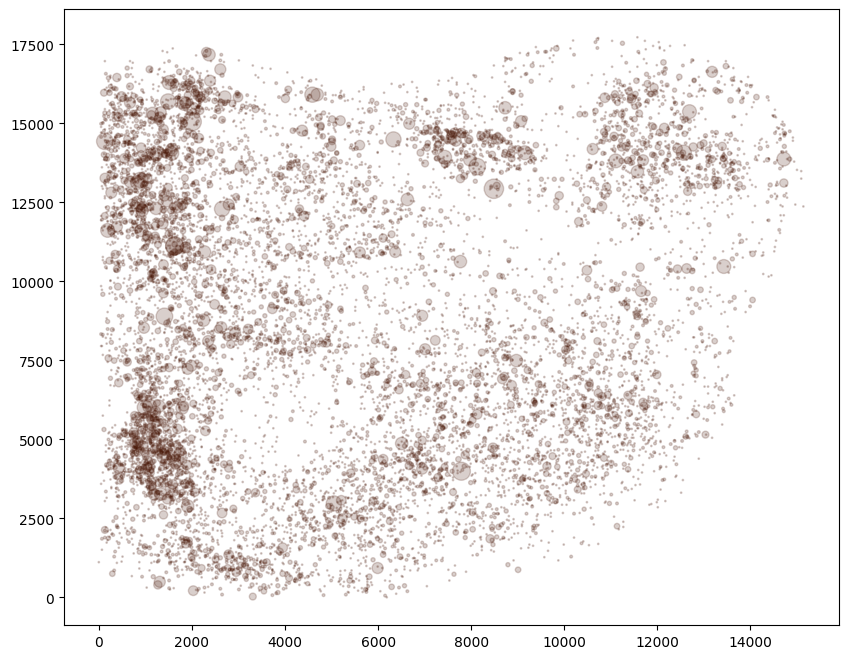

In [16]:
fig, ax = plt.subplots(figsize=(10, 8))
x = ddata.obsm["spatial"][:, 0]
y = ddata.obsm["spatial"][:, 1]
a = ddata[:,"tdTomato"].X.toarray().flatten()
ax.scatter(x, y, s=np.square(a), alpha=0.2, color="#441100", label="Tumor")

In [51]:
fdata

AnnData object with n_obs × n_vars = 568003 × 27798
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt1', 'pct_counts_mt1', 'total_counts_mt2', 'pct_counts_mt2', 'total_counts_rb', 'pct_counts_rb', 'annotations'
    var: 'mt1', 'mt2', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'rank_genes_groups'
    obsm: 'spatial'
    layers: 'counts'

In [47]:
ddata.var_names

Index(['OVA-IRES-NGFR', 'tdTomato'], dtype='object')

In [5]:
#Fibroblasts = ["Col1a1", "Col1a2", "Col3a1","Mmp2", "Myl9", "Dcn","Fap"]
Fibroblasts = ["Col1a1", "Col1a2"]
sc.tl.score_genes(fdata, Fibroblasts, score_name="fibro_score")

In [124]:
fdata_m = fdata[(fdata.obs["annotations"] == "Fibroblast") | (fdata.obs["annotations"] == "Macrophages")]
fdata_t = fdata[fdata.obs["annotations"].str.startswith("effector")]

In [6]:
%config InlineBackend.figure_format = 'png'
%config InlineBackend.print_figure_kwargs = {'dpi': 600}

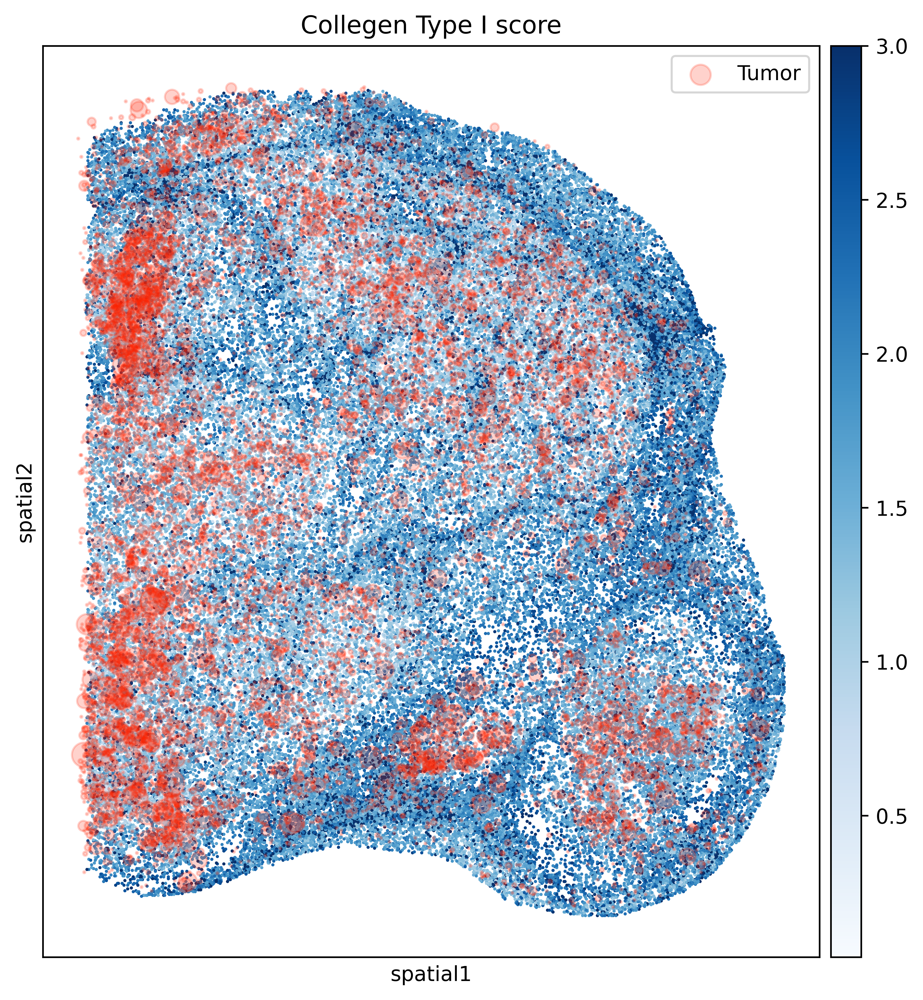

In [13]:
fig, ax = plt.subplots(figsize=(10, 8))
fdata_plot = fdata[fdata.obs["fibro_score"] > 0].copy()

sq.pl.spatial_scatter(fdata_plot, color="fibro_score", cmap="Blues", size=1, shape=None, library_id="spatial", alpha=1, ax=ax, vmax=3)
#sq.pl.spatial_scatter(fdata_m, color="annotations", cmap="BrBG", size=2, shape=None, library_id="spatial", alpha=0.1, ax=ax)
#sq.pl.spatial_scatter(fdata_m, color="annotations", cmap="viridis", size=2, shape=None, library_id="spatial", alpha=0.2, ax=ax)
#sq.pl.spatial_scatter(fdata_f, color="annotations", cmap="BrBG", size=2, shape=None, library_id="spatial", alpha=0.2, ax=ax)
x = ddata.obsm["spatial"][:, 0]
y = ddata.obsm["spatial"][:, 1]
a = ddata[:,"tdTomato"].X.toarray().flatten()
ax.scatter(x, y, s=np.square(a), alpha=0.2, color="#FF2200", label="Tumor")
# x = fdata_t.obsm["spatial"][:, 0]
# y = fdata_t.obsm["spatial"][:, 1]
# ax.scatter(x, y, alpha=0.4, s=1, color="#FF0000", label="effector T")
ax.set_title(f"Collegen Type I score")
#plt.gca().invert_yaxis()
plt.legend()
plt.show()

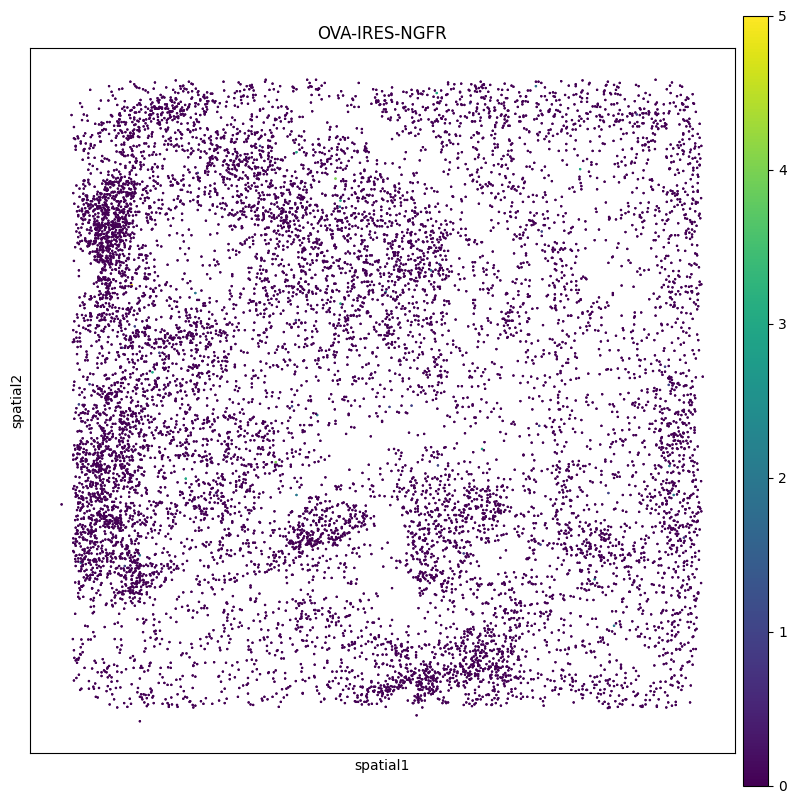

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sq.pl.spatial_scatter(fdata_1, color="n_counts", size=2, shape=None, library_id="spatial", alpha=0.1, ax=ax)
sq.pl.spatial_scatter(ddata, color="OVA-IRES-NGFR", size=2, shape=None, library_id="spatial", ax=ax)